# AIM: 
  This Project aim's to create statistical model that can predict the popularity of song based on various charasterstic features. 

# Overview: 
<p style='text-align: justify;'>  Given the Raw data set, we will first try to pre-process the data by handling the null values. Moving on, we will visualise the data points, both for categorical data points and for continuous data points. Sometimes, the presence of the number of unique values is significant to consider; we will try to understand the data distribution between the categorical values. To get the best out of our model, we will select the most significant and relevant features, followed by eliminating outliers. Finally, we will split our data for cross-validation. The next stage is preparing various models and drawing out the best hyperparameters that gives the lowest error. </p>

<a id='index'>  </a>
# Table Of Contents:

[Step 1:   Import Library's](#step_1)

[Step 2:   Load Data](#step_2)

[Step 3:   Handle Missing Values ](#step_3)

[Step 4:   Exploratory Data Analysis ](#step_4)

[Step 5:   Outlier Detection](#step_5)

[Step 6:   Corelation matrix ](#step_6)

[Step 7:   Feature Selection](#step_7)

[Step 8:   Dimentianality Reduction](#step_8)

[Step 9:   Split Data ](#step_9)

[Step 10:  Data Scaling](#step_10)

[Step 11:  Model Training and Analysis](#step_11)

[Step 12:  Save Model](#step_12)

[Step 13:  Generate Test Results ](#step_13)

[Step 14:  Conclusion](#step_14)

[Step 15:  References ](#step_15)

<a id='step_1'>  </a>

### STEP 1: Import Library's

#### Environment  and Set Up: 
<p style='text-align: justify;'> 
    We have used Python as our programming language to implement this statistical model. To ensure that we do not corrupt our python environment, we have tried to use Anaconda, which allows us to have a virtual python environment. Along with the Python language, we have installed third-party libraries like 'SkLearn', 'Numpy', 'Pandas', 'Jupyter Notebook', 'Matplotlib' and 'Seaborn.' using python package installer (i.e., pip )  
</p>
<p style='text-align: justify;'> 
    
<dl>
    <dt>Numpy:</dt>
      <dd>- This Framework allows us to handle multidimensional arrays and complex mathematical operations </dd>
    <dt>Pandas</dt>
      <dd>- Pandas framework helps us with handling the data tabular data. with this, we can also load the files of various formats </dd>
    <dt>Jupyter Notebook:</dt>
      <dd>- IDE used for development of of model </dd>
    <dt>Matplotlib and Seaborn </dt>
      <dd>- Framework for visualisation of the data.  We can plot various types of plots and draw our observations followed by their respective conclusions </dd>
    <dt>SkLearn </dt>
      <dd>- Sklearn provides us with various built in functions,that allows us to preprocess data points and build statistical machine learning models in an efficient manner </dd>
    
</dl>

</p>

In [55]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
import pickle

from scipy import stats

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error , mean_absolute_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

from dtreeviz.trees import *
from IPython.core.display import display, HTML


[To The Table Of Contents](#index)

<a id='step_2'>  </a>

### STEP 2: Load the Data

<p style='text-align: justify;'> 
    For our regression task, we are provided with a data set in 'CSV' format. To load the data, we use a panda's built-in function "pandas.read_csv("file path") ". The loaded file will be in Pandas Data Frame. To have sneek peak of our data set, we use ".head()" function. By default, we will see the first 5 Rows of the file.  
</p>

In [56]:
# Load out trainig data set 

data = pd.read_csv("cs9856-spotify-regression-problem-2022/CS98XRegressionTrain.csv")
data.head()

,Id,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
0,1,My Happiness,Connie Francis,adult standards,1996,107,31,45,-8,13,28,150,75,3,44
1,2,Unchained Melody,The Teddy Bears,NaN,2011,114,44,53,-8,13,47,139,49,3,37
2,3,How Deep Is Your Love,Bee Gees,adult standards,1979,105,36,63,-9,13,67,245,11,3,77
3,4,Woman in Love,Barbra Streisand,adult standards,1980,170,28,47,-16,13,33,232,25,3,67
4,5,Goodbye Yellow Brick Road - Remastered 2014,Elton John,glam rock,1973,121,47,56,-8,15,40,193,45,3,63


In [57]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 453 entries, 0 to 452
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Id         453 non-null    int64 
 1   title      453 non-null    object
 2   artist     453 non-null    object
 3   top genre  438 non-null    object
 4   year       453 non-null    int64 
 5   bpm        453 non-null    int64 
 6   nrgy       453 non-null    int64 
 7   dnce       453 non-null    int64 
 8   dB         453 non-null    int64 
 9   live       453 non-null    int64 
 10  val        453 non-null    int64 
 11  dur        453 non-null    int64 
 12  acous      453 non-null    int64 
 13  spch       453 non-null    int64 
 14  pop        453 non-null    int64 
dtypes: int64(12), object(3)
memory usage: 53.2+ KB


<hr>

<p style='text-align: justify;'> 
    To prevent biasness during training, we randomly shuffle the records (i.e., rows). Shuffling will ensure that our model is generalised and quickly reach the point of convergence.  Pandas data frame has a built-in function "DataFrame.sample()" and the argument it is essential to mention the number of records we need. Here we will pass the total number of records that are available in the data set.
</p>

In [58]:
# Shuffle the data rows

data = data.sample(n = data.shape[0])
data.head()

,Id,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
49,50,Fireflies,Owl City,pop,2009,180,66,51,-7,12,46,228,3,4,78
113,114,Boulder to Birmingham - Remastered,Emmylou Harris,country rock,1975,126,32,48,-11,10,31,213,78,3,59
111,112,Bailando,Paradisio,bubblegum dance,1997,133,94,65,-9,12,84,229,8,4,58
391,392,It Takes Two,Marvin Gaye,classic soul,1966,151,48,52,-11,8,81,178,21,5,62
233,234,Knowing Me Knowing You,ABBA,europop,1976,107,73,55,-7,24,91,242,4,3,61


[To The Table Of Contents](#index)


<a id='step_3'>  </a>

### STEP 3: Handle Missing Values

<p style='text-align: justify;'> 
    It is improbable that all the data points are in place when collecting the data. There will be a high chance that some data points are missing. Some common reasons for missing data are undefined values, data collection errors, incorrect implementation of SQL Queries and many more. We must ensure that we handle our NaN values before processing them for modelling. NaN values are handled in many ways 1) Ignore the values or drop missing data points 2) Impute the NaN values with Mean, Median or Mode 3) More intuitive one will be to use the ML model like KNN to predict the data points. Since our data set is very small, we will eliminate the records with missing values. 
</p>
<p style='text-align: justify;'> 
    To get the missing values use the function ".isna()" ,which returns an array such that missing data points is labelled one. We will use the "sum()" function to add this up.  
</p>

In [59]:
# Amount of missing values 

data.isna().sum()   

Id            0
title         0
artist        0
top genre    15
year          0
bpm           0
nrgy          0
dnce          0
dB            0
live          0
val           0
dur           0
acous         0
spch          0
pop           0
dtype: int64

As wee see here only 3% of the data is missing; soo we will eliminate the data points by dropppng the records that has the missing values 

In [60]:
# drop the records that are having the null values! 

data.dropna(inplace= True, axis= 0)
data.reset_index(drop= True, inplace= True)

# see the amount of data that is missing 
np.round( data.isna().sum() / data.shape[0] *100 ) 


Id           0.0
title        0.0
artist       0.0
top genre    0.0
year         0.0
bpm          0.0
nrgy         0.0
dnce         0.0
dB           0.0
live         0.0
val          0.0
dur          0.0
acous        0.0
spch         0.0
pop          0.0
dtype: float64

[To The Table Of Contents](#index)

<a id='step_4'>  </a>

### STEP 4: Exploratory Data Analytics

<p style='text-align: justify;'> 
   EDA visualises the data to understand better the distribution of values with respect to other features. We can analyse patterns, anomalies and trends using different types of charts, ensuring a promising model. 
</p>
<p style='text-align: justify;'> 
   Visualise continuous <b> numerical data </b> to see if the data points have Gaussian distribution or not. The data points must not be tailed heavy, if so this leads to a biased model. Popular data transformation techniques are Logarithmic, Reciprocal, Square Root, Exponential and Box-Cox
</p>
<p style='text-align: justify;'> 
   For Categorical data points, there must be equal importance given to every categorical feature. Sometimes one class will have more data points belonging to one class. We can either eliminate additional data points or perform oversampling to generate synthetic data points to handle this imbalance. One of the most common methods to add synthetic data is Synthetic Minority Oversampling Technique in short (SMOT). In this data Set, we have only one or two data points belonging to a particular class, for example, 'g funk', 'pop' and others. Some data points are comparatively very high in numbers, for example, 'adult standards', 'blues rock' and others. Here we will not try creating synthetic data as the minimum number of data points needed is 3. For this regression task, we will eliminate the 'top_genre' feature. 
</p>

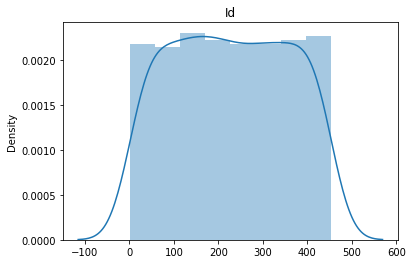

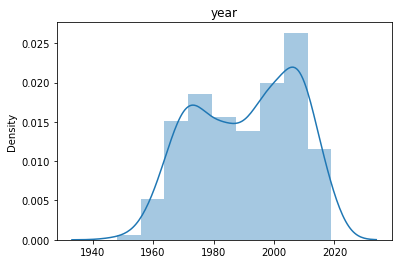

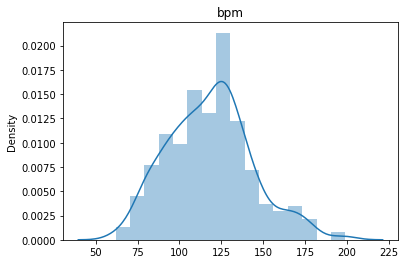

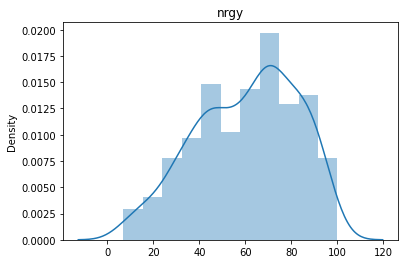

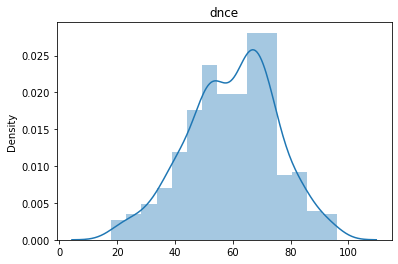

...

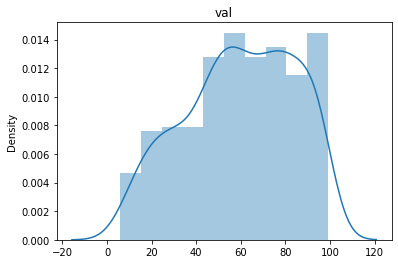

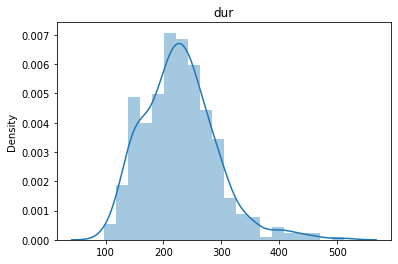

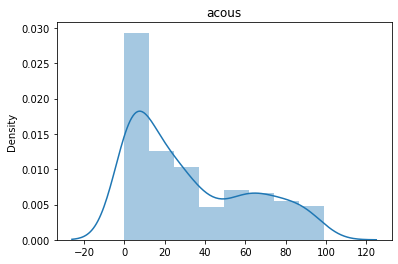

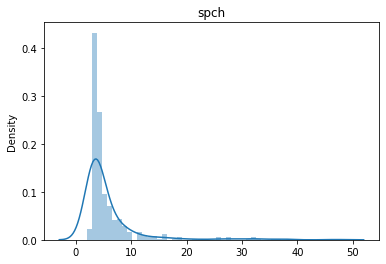

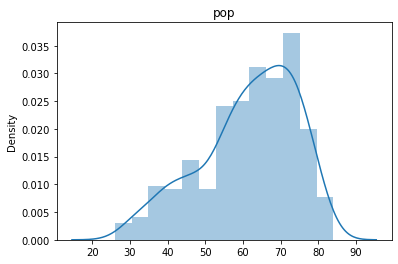

In [61]:
# Plot the various numerical values/ Continious Values and there distrobution 

for i in data.select_dtypes(np.number):
    sns.distplot(data[i].values);
    plt.title(i);
    plt.show();
    

![Noraml Distribution](images/normal-distribution.jpeg) 

(Simplypsychology.org, 2022)

<p style='text-align: justify;'> 
    As we can see, features like 'live', 'acous', 'spch', 'dB' are not distributed Gaussianly. There are various ways to transform the data to a bell-shaped Gaussian distribution; some typical transformation techniques are log, exponential, Box-cox, and square root transformations. Here we have used simple logarithmic transformation. Every data point is individually transformed using a log function. The log transformation reduces or removes the skewness of our original data. The important caveat here is that the original data has to follow or approximately follow a log-normal distribution (Htoon, 2022). 
</p>

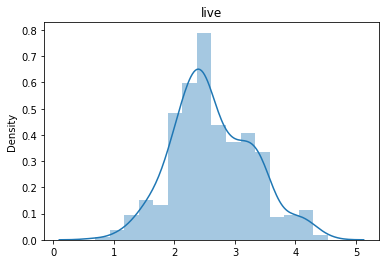

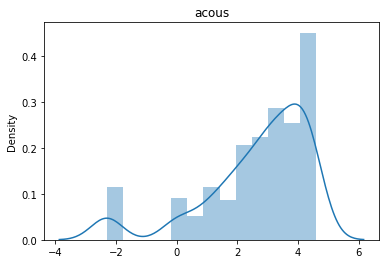

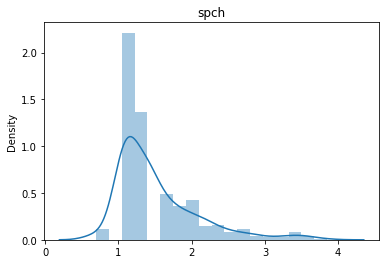

In [62]:
features_to_transform = ['live', 'acous', 'spch']


for d in features_to_transform:
    """
    * Iterate trough every feature present in the the list
    * Implement log transformation on every data point
    * Plot the distribution of every feature
    """
    data[d] = [ np.log(i+0.1) if i == 0 else np.log(i)  for i in data[d].values ]
    sns.distplot(data[d].values);
    plt.title(d);
    plt.show();



<p style='text-align: justify;'> 
Above we have transformed the numerical data to get a normal distribution. Now to handle <b>categorical data</b>, let us visualise the number of classes every data point belong to! There can be one of three outcomes for categorical features, 1) Every data point is <b>unique</b>; we do not have any common ground to interrelate values. 2) There is an <b>unequal</b> distribution of classes; here, we can create new synthetic data provided there are abundant data points 3) <b>Equal</b> Distribution of data points in the classes; this is an ideal condition where the number of data points belonging to a particular class is identical. For the data provided here, the song title is uniques to all; hence we drop that feature; similarly, the data points are imbalanced for "top genre" and the "artist". Adding synthetic data will lead to tremendous change in the data set, thus altering the output. We have decided to <b>drop</b> all the categorical features. 
</p>

In [63]:
# Lets see the number of unique values in the categorical features 

for i in data.select_dtypes(np.object0):
    print(f"The amount of the unique values in {i} are {data[i].nunique()/data.shape[0] *100 } % ")
    

The amount of the unique values in title are 99.54337899543378 % 
The amount of the unique values in artist are 75.57077625570776 % 
The amount of the unique values in top genre are 19.63470319634703 % 


<p style='text-align: justify;'> 
    As you can see here "ID" Column is just the numbers from 1 to the sape of the data frame, we will drop the column! 
Also we the "songs colum has all the unique vales! although the song is important but all the values are unique thus its better we will eliminate that feaature !
</p>

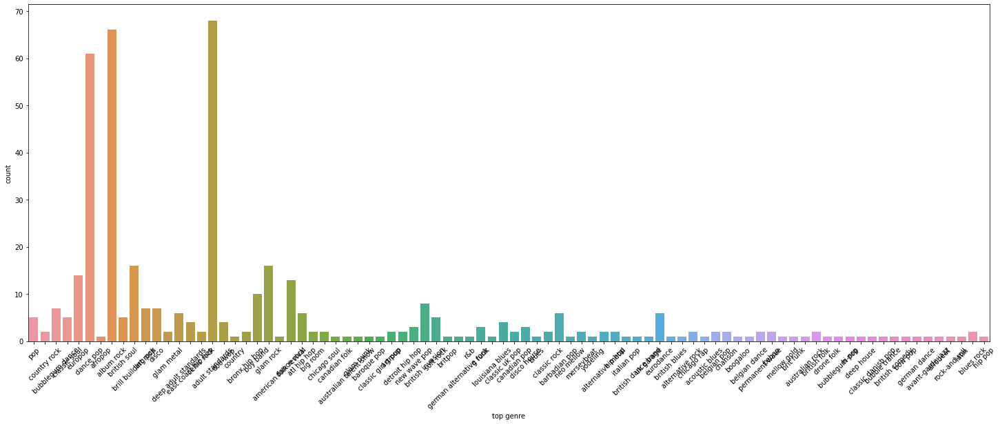

In [64]:
"""
* 
"""
plt.figure(figsize=(25,9))
sns.countplot(data['top genre'])
plt.xticks(rotation= 45 )
plt.title("Data Distribution of Top Genre")
plt.show()

In [65]:
# Removing all the categorical values 

data.drop(['Id','title', 'top genre', 'year', 'artist'], axis= 1, inplace= True)

[To The Table Of Contents](#index)

<a id='step_5'>  </a>

### STEP 5: Outlier Detection

<p style='text-align: justify;'> A value that is significantly different from the rest of the values in dataset is referred to as an <b>outlier</b>, also known as an extreme value.
The presence of outliers in the dataset greatly affect the mean of each variable(column) in the dataset which inturn affevts the standard deviation.
A boxplot is used to visually display outliers and interquartile range (IQR).

As indicated in the image below, an outlier is a data point in a dataset that is either below 1.5 IQRs of the first quartile (Q1) or above 1.5 IQRs of the third quartile (Q3).

Removal of outliers using IQR method involves calculation of 1st and 3rd quartiles which is named as Q1 and Q3.
Compute the difference between 3rd and 1st quartile 
The lower bound is calculated as (Q1–1.5*IQR) and upper bound is calculated as (Q3+1.5*IQR)

The values which falls below the lower bound and above the upper bound and marked as outliers which are then removed from the dataframe.
    </p>

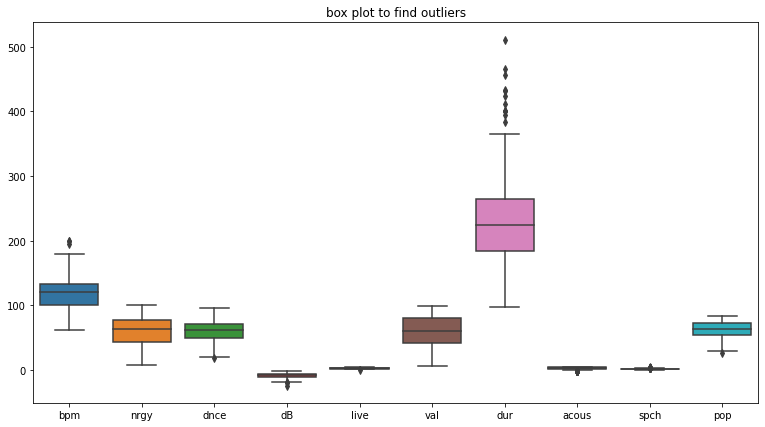

In [66]:
plt.figure(figsize=(13,7))
plt.title("Data Points with outliers")
sns.boxplot(data = data)
plt.show()

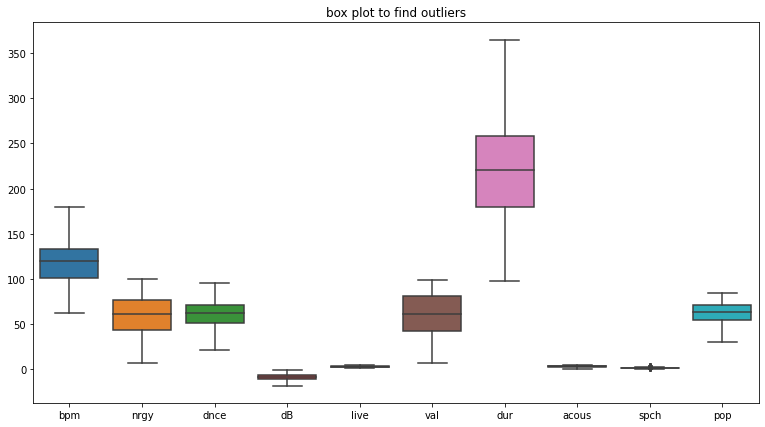

In [67]:
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3-Q1
lower_bound = (Q1-1.5*IQR)
upper_bound = (Q3+1.5*IQR)


data = data[~((data < lower_bound) | (data > upper_bound ) ).any(axis = 1)];


plt.figure(figsize=(13,7))
plt.title("Data Points without outliers")
sns.boxplot(data = data)
plt.show()

[To The Table Of Contents](#index)


<a id='step_6'>  </a>

### STEP 6: corelation matrix 

<p style='text-align: justify;'> 
The correlation matrix represents the correlation between columns present in the given dataset. The value of correlation varies from -1 to +1 where positive value represent positive correlation between given columns,zero represents no correlation and negative value represent negative correlation.

DataFrame.corr() method is used to determine correlation between different columns.
The heat map reflecting the correlation matrix is created using the Seaborn heatmap() function.

The value of correlation is depicted by each square in the heatmap, which represents the value of correlation between the respective variables.
</p>

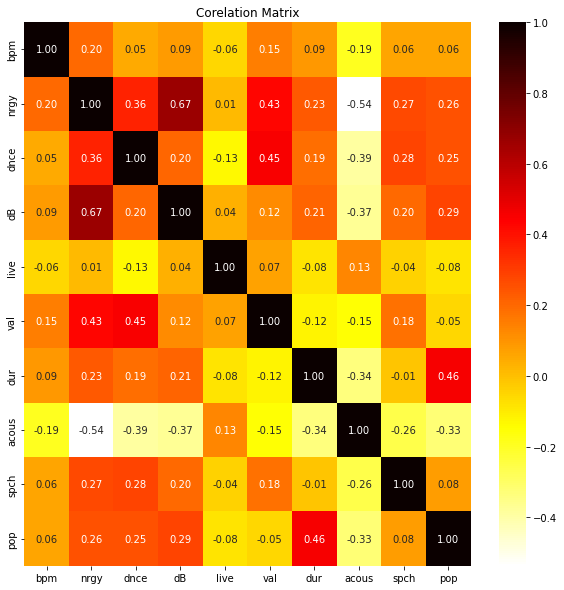

In [68]:
plt.figure(figsize=(10,10))
sns.heatmap(data.corr(), annot= True, fmt= '.2f', cmap= 'hot_r'  )
plt.title("Corelation Matrix")
plt.show()

[To The Table Of Contents](#index)


<a id='step_7'>  </a>

### STEP 7: Feature Selection

<p style='text-align: justify;'> Feature selection is the process which reduces the number of input variables to reduce computation involved,reduce training time and improve performance of developing predictive model.
The relationship between each statistical input variable and the output variable is evaluated, and the input variables with the strongest relation with the target variable are selected.
</p>

In [69]:
# analiseing the feature importance using randome forest

fe_imp = RandomForestRegressor(max_depth= 4 )
fe_imp.fit(data.iloc[:, :-1].values , data.iloc[:, -1].values)

for i, j in enumerate(fe_imp.feature_importances_):
    print(f"{i} :   {data.columns[i]}  has the { np.around(j , decimals= 2 ) } importance")

0 :   bpm  has the 0.03 importance
1 :   nrgy  has the 0.09 importance
2 :   dnce  has the 0.05 importance
3 :   dB  has the 0.09 importance
4 :   live  has the 0.03 importance
5 :   val  has the 0.04 importance
6 :   dur  has the 0.54 importance
7 :   acous  has the 0.11 importance
8 :   spch  has the 0.02 importance


[To The Table Of Contents](#index)

<a id='step_8'>  </a>

### STEP 8: Dimentianality Reduction 

<p style='text-align: justify;'>  Dimensionality reduction refers to techniques performed to reduce the number of dimensions or input variables in the feature set. Higher dimensionality may contain thousands or millions of variables as input which increases complexity of the model with high chances of overfitting which is referred as curse of dimensionality. Having fewer dimensions means less parameters which help to develop simple models especially for linear models.
</p>

<hr>

<p style='text-align: justify;'>  The Principal Component Analysis (PCA) is a widely used technique for reducing the dimensionality of a dataset, which improves interpretability and reduces information loss. It finds the axis that retains the most variance or minimises the mean squared distance between the original dataset and the axis projection.

PCA aids in the discovery of significant features in a dataset by converting a large number of variables into a smaller set that includes the major portion of the information in the larger set. Smaller data sets are easier to examine and visualise, and machine learning algorithms can evaluate data much more readily and rapidly without having to deal with additional aspects, however this sacrifices accuracy for simplicity.
    
</p>

In [70]:
from sklearn.decomposition import PCA

pca = PCA(n_components= 1)

most_valued_data_points = pca.fit_transform(data.iloc[:, :-1].values)


DATA = pd.DataFrame(data = most_valued_data_points , columns = ['PC-1'])

DATA['Target'] = data.iloc[:, -1].values


DATA.head()

,PC-1,PC-1,Target
0,10.797550,-14.809521,78
1,-9.832616,34.811323,59
2,11.313004,-41.832161,58
3,-43.812188,-21.623395,62
4,19.817708,-22.406451,61


[To The Table Of Contents](#index)


<a id='step_9'>  </a>

### STEP 9: Split data 

In [71]:
# SPLIT DATA

X_train, X_test, y_train, y_test = train_test_split( DATA.iloc[:, :-1].values, 
                                                    DATA.iloc[:, -1].values, 
                                                    test_size=0.20)

[To The Table Of Contents](#index)


<a id='step_10'>  </a>

### STEP 10: Data Scaling  

<p style='text-align: justify;'> Normalization is a scaling method that shifts and rescales data to make them range between 0 and 1 which is done by subtracting the value from min value and dividing by the max minus the min. Min-Max scaling is another name for it. Normalization is the process of converting the columns in a dataset to the same scale. When the ranges of features are different, it is just necessary.

Standardizing the feature values of the training and test sets by using the standard scaler function from the scikit learn library, which subtracts the mean value then divide by variance so the resultant has in unit variance and it does not bound values to particular range. It is useful when the scales of the individual features are different, standardizing the features helps to obtain standard normally distributed input values. The purpose for standardising variables is to improve the performance of algorithms. </p>

In [72]:
# DATA SCALING 

scalar = StandardScaler()

X_train = scalar.fit_transform(X_train)
X_test = scalar.fit_transform(X_test)

[To The Table Of Contents](#index)

<a id='step_11'>  </a>

### STEP 11: Model Training and Analysis 

In [73]:
def regression_evaluation_report(test , predict):
    """
    input: 
        test: actual values 
        predict: values predicted by the model 
    
    output: Generates a report based on various metrics  
    """

    print(f"Root Mean Square Error = { np.sqrt( mean_squared_error(test, predict) )} ")
    
    print(f"The mean absolute error = {mean_absolute_error(test, predict) }")

    print(f"The mean absolute percentage error = {mean_absolute_percentage_error(test, predict) }  ")

    print(f" r2_score = {r2_score(test, predict) }  ")






In [74]:
def plot_learning_curve(model, model_type):
    """
    input  : takess the object of the model
    output :  
    """
    train_error , test_error = [] , []

    for i in range(1 , len(X_train)):
        model.fit(X_train[:i] , y_train[:i])
        y_train_pred = model.predict(X_train[:i])
        y_test_pred  = model.predict(X_test)
        train_error.append(mean_squared_error(y_train[:i], y_train_pred))
        test_error.append(mean_squared_error(y_test_pred , y_test))
    
    plt.figure(figsize=(10,10))
    plt.plot(np.sqrt(train_error) , "r-+" , label = "Train" )
    plt.plot(np.sqrt(test_error) , "b-" , label = "Test" )
    plt.xlabel(" epochs ")
    plt.ylabel("RMSE")
    plt.title(model_type)
    plt.legend()
    plt.show()
    
    

### Simple Linear Regression 

Root Mean Square Error = 10.874085625354002 
The mean absolute error = 9.147466112004105
The mean absolute percentage error = 0.16416715084740424  
 r2_score = 0.2753072745732389  


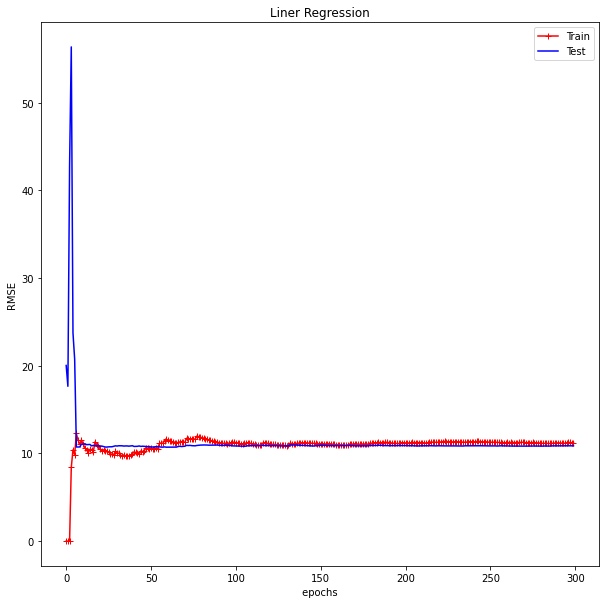

In [75]:
model_1 = LinearRegression() 
model_1.fit(X_train, y_train)
y_pred_1 = model_1.predict(X_test)

regression_evaluation_report(y_test, y_pred_1)
plot_learning_curve(model_1, "Liner Regression")

### Regularized Linear Regression (Elastic Net)

Root Mean Square Error = 10.954605744773751 
The mean absolute error = 9.18388678391734
The mean absolute percentage error = 0.1659116767608581  
 r2_score = 0.2645351711151751  


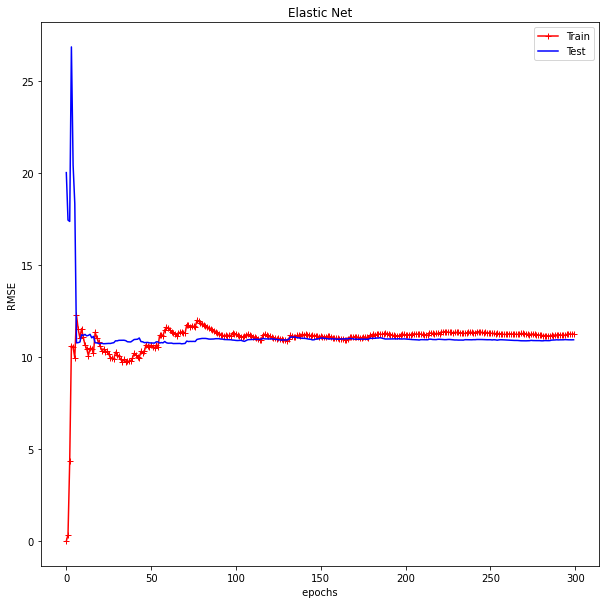

In [76]:
model_1_1 = ElasticNet(alpha= 0.2 , l1_ratio= 0.6)

model_1_1.fit(X_train, y_train)
y_pred_1_1 = model_1_1.predict(X_test);

regression_evaluation_report(y_test, y_pred_1_1)
plot_learning_curve(model_1_1, "Elastic Net")

### Decission Tree 

Root Mean Square Error = 16.52310981306899 
The mean absolute error = 12.039473684210526
The mean absolute percentage error = 0.2227711960264675  
 r2_score = -0.6732159019407904  


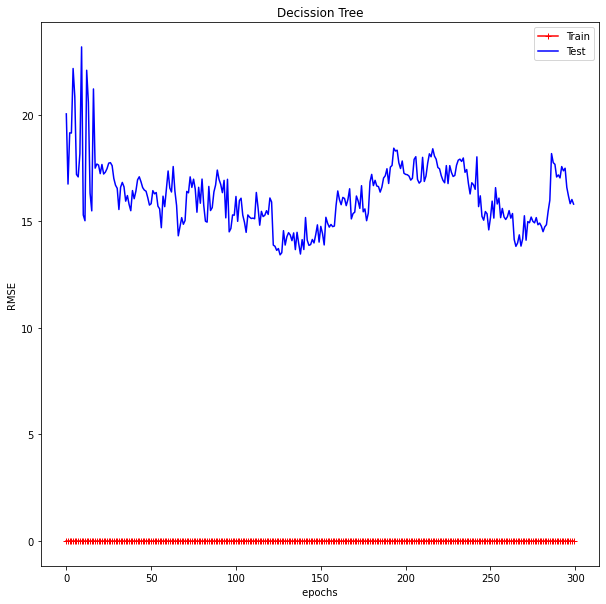

In [77]:
model_2 = DecisionTreeRegressor()
model_2.fit(X_train, y_train)
y_pred_2 = model_2.predict(X_test)

regression_evaluation_report(y_test, y_pred_2)
plot_learning_curve(model_2, "Decission Tree")

viz = dtreeviz(model_2 ,X_train, y_train, target_name='Target', feature_names= ['PC-1','PC-2'], scale= 0.3)

# Visualise the decission tree 
viz

As we see here the decission tree has over-fitted, every data point has been learnt as a result the error of the test set is very high!! Now to over come this we try to do some hyper parameter tuning 

Root Mean Square Error = 10.8281419212912 
The mean absolute error = 8.69711327392254
The mean absolute percentage error = 0.15831106451360547  
 r2_score = 0.2814180837698771  


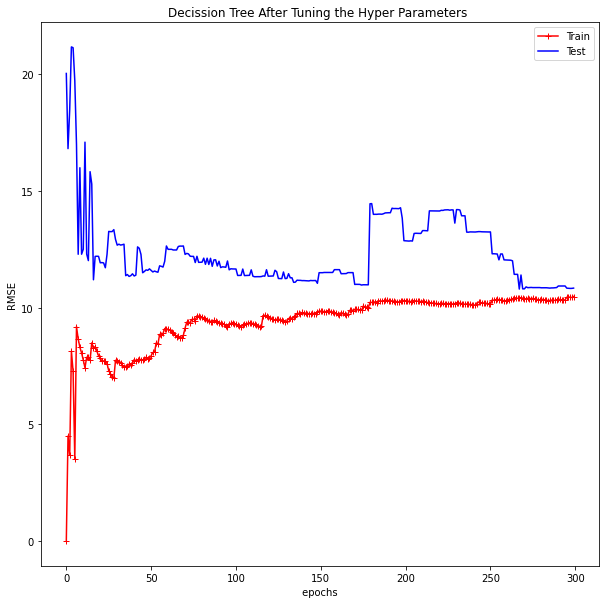

Decision Tree Structure


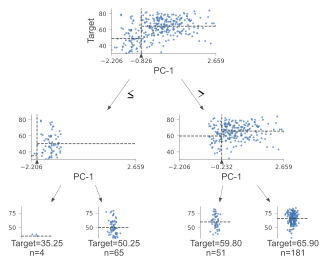

In [78]:
model_2 = DecisionTreeRegressor( max_depth = 2 , min_samples_split = 3 ,
                                min_impurity_decrease = 0.01)

model_2.fit(X_train, y_train)
y_pred_2 = model_2.predict(X_test)

regression_evaluation_report(y_test, y_pred_2)
plot_learning_curve(model_2, "Decission Tree After Tuning the Hyper Parameters ")

print("Decision Tree Structure")

viz = dtreeviz(model_2 ,X_train, y_train, target_name='Target', feature_names= ['PC-1', 'PC-2'], scale= 1)

# Visualise the decission tree 
viz

[To The Table Of Contents](#index)


### Random forest 

Root Mean Square Error = 11.904917603994356 
The mean absolute error = 9.329999999999998
The mean absolute percentage error = 0.16956040144752035  
 r2_score = 0.13139726436706012  


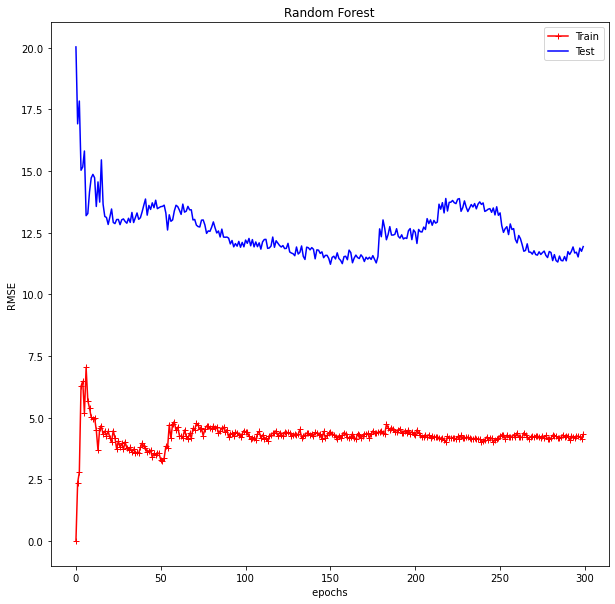

In [79]:
model_3 = RandomForestRegressor()

model_3.fit(X_train, y_train)
y_pred_3 = model_3.predict(X_test)
regression_evaluation_report(y_test, y_pred_3)
plot_learning_curve(model_3, "Random Forest")

In [80]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [3, 6,9, 11,2]

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
model_3 = RandomForestRegressor()

rf_random = RandomizedSearchCV(estimator = RandomForestRegressor(), 
                               param_distributions = random_grid, 
                               n_iter = 100, 
                               cv = 3, 
                               verbose=2, 
                               random_state=42, 
                               n_jobs = -1)

# Fit the random search model
rf_random.fit(X_train, y_train)


Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] END bootstrap=False, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.1s
[CV] END bootstrap=False, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.2s
[CV] END bootstrap=False, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.2s
[CV] END bootstrap=False, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=800; total time=   0.3s
[CV] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=600; total time=   0.4s
[CV] END bootstrap=False, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=800; total time=   0.4s
[CV] END bootstrap=False, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=800; to

RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [3, 6, 9, 11, 2],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

In [81]:
rf_random.best_params_

{'n_estimators': 600,
 'min_samples_split': 5,
 'min_samples_leaf': 4,
 'max_features': 'sqrt',
 'max_depth': 3,
 'bootstrap': True}

Root Mean Square Error = 10.93794027482349 
The mean absolute error = 9.073343494238406
The mean absolute percentage error = 0.164573997805043  
 r2_score = 0.26677122487685945  


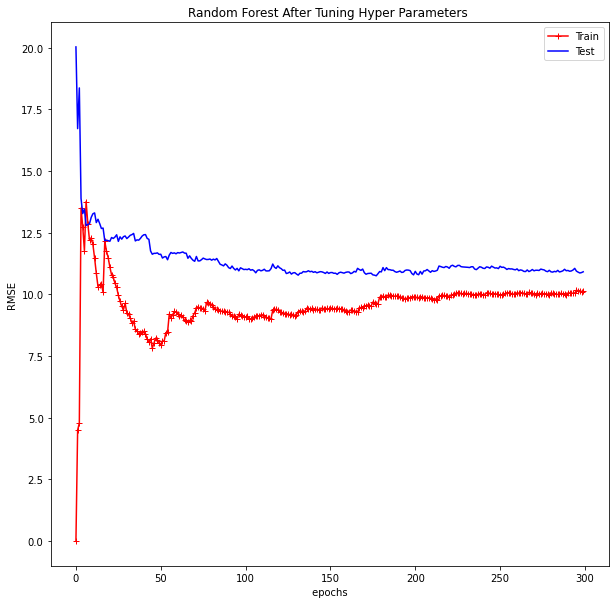

In [82]:
model_3 = RandomForestRegressor(n_estimators =  600,
                                min_samples_split = 5, 
                                min_samples_leaf = 4, 
                                max_features = 'sqrt',
                                max_depth = 3, 
                                bootstrap = True)

# Training a model 
model_3.fit(X_train, y_train)

# Performing Prediction 
y_pred_3 = model_3.predict(X_test)

regression_evaluation_report(y_test, y_pred_3)

plot_learning_curve(model_3, "Random Forest After Tuning Hyper Parameters ")

### SVM for Regression

Root Mean Square Error = 10.806447800084552 
The mean absolute error = 8.770057099530602
The mean absolute percentage error = 0.16773950370863402  
 r2_score = 0.28154910842077085  


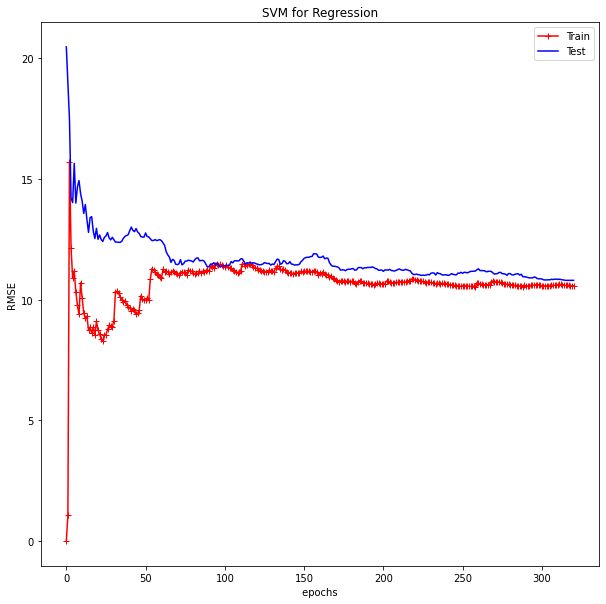

In [32]:
# Without Tuning hyper parameters 

model_4 = SVR()
model_4.fit(X_train, y_train)
y_pred_4 = model_4.predict(X_test)

regression_evaluation_report(y_test, y_pred_4)
plot_learning_curve(model_4, "SVM for Regression")

In [33]:
#Tuning Hyper Parameters using Gaussian kernel 

# defining parameter range

param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
 
grid = RandomizedSearchCV(estimator = SVR(),
param_distributions = param_grid, 
n_iter = 100, 
cv = 3, 
verbose=2, 
random_state=42, 
n_jobs = -1)


 
# fitting the model for grid search
grid.fit(X_train, y_train)

Fitting 3 folds for each of 25 candidates, totalling 75 fits
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END .....................C=0.1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .....................C=0.1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END .....................C=0.1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END ....................C=0.1, gamma=0.0001

RandomizedSearchCV(cv=3, estimator=SVR(), n_iter=100, n_jobs=-1,
                   param_distributions={'C': [0.1, 1, 10, 100, 1000],
                                        'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                                        'kernel': ['rbf']},
                   random_state=42, verbose=2)

In [34]:
grid.best_params_

{'kernel': 'rbf', 'gamma': 0.1, 'C': 10}

Root Mean Square Error = 10.273865273913223 
The mean absolute error = 8.284342447587509
The mean absolute percentage error = 0.15164903057339743  
 r2_score = 0.3506200120774631  


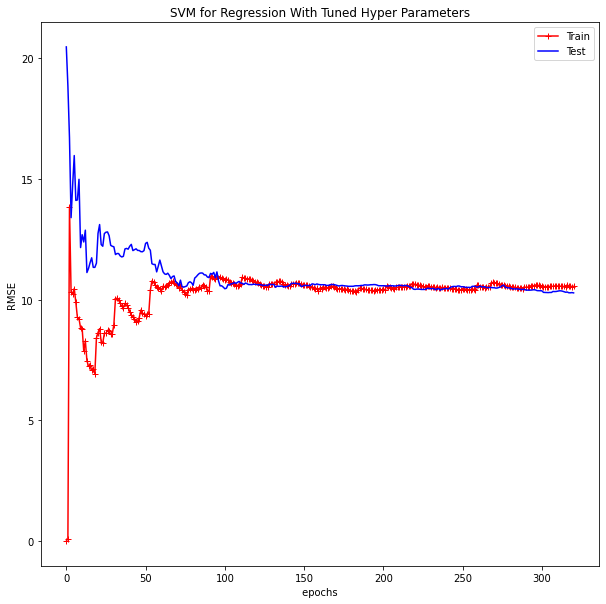

In [35]:
model_4_1 = SVR(C = 10, gamma = 0.1,  kernel = 'rbf')
model_4_1.fit(X_train, y_train)
y_pred_4_1 = model_4_1.predict(X_test)

regression_evaluation_report(y_test, y_pred_4_1)
plot_learning_curve(model_4_1, "SVM for Regression With Tuned Hyper Parameters")

In [36]:
#Tuning Hyper Parameters using Polynomial Kernel

# defining parameter range

param_grid = {'C': [0.1, 1, 10, 100, 1000, 5,0.001], 
            'degree': [3,5,2] , 
            'coef0' : [0.01 ,  0.2, 0.8],
            'kernel': ['poly']}
 
grid = RandomizedSearchCV(estimator = SVR(),
                               param_distributions = param_grid, 
                               n_iter = 100, 
                               cv = 3, 
                               verbose=2, 
                               random_state=42, 
                               n_jobs = -1)


 
# fitting the model for grid search
grid.fit(X_train, y_train)

Fitting 3 folds for each of 63 candidates, totalling 189 fits
[CV] END ...........C=0.1, coef0=0.01, degree=3, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=3, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=3, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=5, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=5, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=2, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=5, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=2, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=2, kernel=poly; total time=   0.0s
[CV] END ............C=0.1, coef0=0.2, degree=3, kernel=poly; total time=   0.0s
[CV] END ............C=0.1, coef0=0.2, degree=3, kernel=poly; total time=   0.0s
[CV] END ............C=0.1, coef0=0.2, degree=3

RandomizedSearchCV(cv=3, estimator=SVR(), n_iter=100, n_jobs=-1,
                   param_distributions={'C': [0.1, 1, 10, 100, 1000, 5, 0.001],
                                        'coef0': [0.01, 0.2, 0.8],
                                        'degree': [3, 5, 2],
                                        'kernel': ['poly']},
                   random_state=42, verbose=2)

In [37]:
grid.best_params_

{'kernel': 'poly', 'degree': 2, 'coef0': 0.2, 'C': 1}

Root Mean Square Error = 10.330197286550883 
The mean absolute error = 8.235628102154186
The mean absolute percentage error = 0.15026065277181974  
 r2_score = 0.3434793366015403  


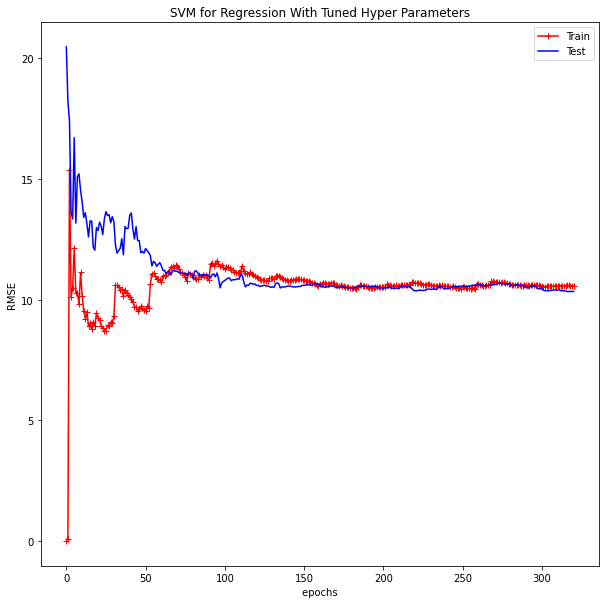

In [38]:
model_4_2 = SVR( kernel = 'poly', degree = 2, coef0 = 0.2, C = 1)
model_4_2.fit(X_train, y_train)
y_pred_4_2 = model_4_2.predict(X_test)

regression_evaluation_report(y_test, y_pred_4_2)
plot_learning_curve(model_4_2, "SVM for Regression With Tuned Hyper Parameters")

<a id='step_12'>  </a>

### STEP 12: Save Model

In [41]:
if False: 
    Pkl_Filename = "best__model.pkl"  

    with open(Pkl_Filename, 'wb') as file:  
        pickle.dump(model_4_1, file) 

if True:
    # Load the Model back from file
    with open('best_model.pkl', 'rb') as file:  
        model = pickle.load(file)

EOFError: Ran out of input

[To The Table Of Contents](#index)

<a id='step_13'>  </a>

### STEP 13: Generate Test Results 


As we see here from the analysis, the model that gives the best result (i.e., least RMSE ) with test data is 
tuned Randome forest ! 


In [ ]:
# Load the test data points 

df = pd.read_csv("cs9856-spotify-regression-problem-2022/CS98XRegressionTest.csv")
df.head()

In [ ]:
Id = df.iloc[:, 0].values

In [ ]:
# Removing all the categorical values 

df.drop(['Id','title', 'top genre', 'artist','year'	], axis= 1, inplace= True)
df.head()

In [ ]:
features_to_transform = ['live', 'spch' ]

for d in features_to_transform:
    
    df[d] = np.log(df[d].values)

In [ ]:
"""
Lets try to scale and transform the data based on, how that data points are trained 
"""

# Reduce the dimentions of the data points so that it is similar to how the data was trained 
Test = pca.transform(df.iloc[:,:].values)

# Scale the data 
Test = scalar.transform(Test)

# Get the predictions for the test data points 




In [ ]:
# Store the results in the dataFrame
res = pd.DataFrame()
res['Id'] = Id
res['pop'] = pd.DataFrame(   model_4_2.predict(Test)  )

# Save the csv file 
res.to_csv( 'results_1.csv' , index = False)

[To The Table Of Contents](#index)

<a id='step_14'>  </a>

# Conclusion

[To The Table Of Contents](#index)

<a id='step_15'>  </a>

# References



<ol>
  <li> Htoon, K., 2022. Log Transformation: Purpose and Interpretation. [online] Medium. Available at: <https://medium.com/@kyawsawhtoon/log-transformation-purpose-and-interpretation-9444b4b049c9#:~:text=Log%20transformation%20is%20a%20data,with%20a%20log(x).&text=In%20other%20words%2C%20the%20log,follow%20a%20log%2Dnormal%20distribution.> [Accessed 15 February 2022]. </li>
  <li>Simplypsychology.org. 2022. [online] Available at: <https://www.simplypsychology.org/normal-distribution.jpg> [Accessed 15 February 2022].</li>
  <li>Milk</li>
</ol> 

[To The Table Of Contents](#index)